# Creating a new dataset
In this notebook we will have a look at creating a new dataset from a set of records.

In [1]:
# Imports
import panel as pn

from icevision.all import *
import icedata
from icevision_dashboards.dashboards import *
from icevision_dashboards.data import *

In [2]:
pn.extension()

## Loading the data

In [3]:
# load the data and class_map
path = icedata.pets.load_data()
class_map = icedata.pets.class_map()

# use the provided dataset parser
parser = icedata.pets.parser(data_dir=path)
# we want all the images before we create a subset
records = parser.parse(RandomSplitter([1]))[0]

  0%|          | 0/3686 [00:00<?, ?it/s]

INFO     - Autofixing records | icevision.parsers.parser:parse:136


  0%|          | 0/3686 [00:00<?, ?it/s]

## Create a subdataset

IcevisionDashboards provides three types of filters for data a list selection for catgegorical data and for numeric data a range selection and a scatter plot based selection. We will use range based selection here. First we have to create a datset to do the selection from.

In [4]:
# create a dataset the can be consumed by a dashboard
dash_ds = BboxRecordDataset(records, class_map=class_map)

To create a selection first set the ranges for the histograms with the range silder than select the classes you want, than click the create button at to bottom to create the selected dataset.

In the Dataset Overview tab you can see the created dataset(s). Lets give the dataset the name `test_ds` and export it with the `Export` button. This will create json files for each dataset with the name of the dataset being the name of the json file, the json files will be created under the path given in the `Export path` input (if the path does not exist, it will be created). If we now check in the folder datasets we should see a file named `test_ds.json`.

Tabs
    [0] Column
        [0] Row(align='center')
            [0] GridSpec(height=650, ncols=3, nrows=3, sizing_mode='fixed', width=1000)
                [0] Column(height=216, width=333)
                    [0] RangeSlider(end=3295.5, name='width', start=82.5, step=64.3, value=(82.5, 3295.5), width=323)
                    [1] Bokeh(Figure)
                [1] Column(height=216, width=333)
                    [0] RangeSlider(end=2630.98, name='height', start=83.02, step=51.0, value=(83.02, 2630.98), width=323)
                    [1] Bokeh(Figure)
                [2] Column(height=216, width=333)
                    [0] MultiSelect(height=216, name='label', options=['Abyssinian', ...], sizing_mode='fixed', value=['Abyssinian', ...], width=333)
                [3] Column(height=216, width=333)
                    [0] RangeSlider(end=0.9806190335373541, name='area_normalized', start=-0.0059727689521582635, step=0.0, value=(-0.0059727689521582635, ..., width=323)
                    [1] Bokeh(Figure)
                [4] Column(height=216, width=333)
                    [0] RangeSlider(end=2.2201574335950633, name='bbox_ratio', start=0.44612685666818297, step=0.0, value=(0.44612685666818297, ..., width=323)
                    [1] Bokeh(Figure)
                [5] Column(height=216, width=333)
                    [0] RangeSlider(end=1553.11, name='bbox_width', start=11.89, step=30.8, value=(11.89, 1553.11), width=323)
                    [1] Bokeh(Figure)
                [6] Column(height=216, width=333)
                    [0] RangeSlider(end=1550.13, name='bbox_height', start=6.869999999999999, step=30.9, value=(6.869999999999999, ..., width=323)
                    [1] Bokeh(Figure)
                [7] Column(height=216, width=333)
                    [0] RangeSlider(end=2.01, name='num_annotations', start=0.99, step=0.0, value=(0.99, 2.01), width=323)
                    [1] Bokeh(Figure)
        [1] Row(align='center')
            [0] Button(height=50, name='Create')
    [1] Column
        [0] Row(align='center')
            [0] Column
                [0] Button(height=25, name='Delete', sizing_mode='fixed', width=1000)
                [1] DataFrame(height=125, selection=[0], sizing_mode='fixed', value=Empty DataFrame
Columns: [..., width=500)
        [1] Row(align='center')
            [0] Tabs
                [0] Column
                    [0] Markdown(str)
                    [1] DataFrame(formatters={'no_imgs': HTMLTemplateFo...}, height=64, selection=[0], sizing_mode='fixed', value=   no_imgs  no_classes  \
..., width=1000)
                    [2] Markdown(str)
                    [3] DataFrame(formatters={'Num. imgs.': HTMLTemplat...}, height=64, selection=[0], sizing_mode='fixed', value=   Num. imgs.  ..., width=1000)
                    [4] Markdown(str)
                    [5] DataFrame(formatters={'Class': HTMLTemplateForm...}, height=112, selection=[0], sizing_mode='fixed', value=              ..., width=1000)
                    [6] Row(align='center')
                        [0] Bokeh(Figure)
                [1] GridSpec(align='center', height=450, ncols=2, nrows=2, sizing_mode='fixed', width=1000)
                    [0] Column(height=225, width=500)
                        [0] Markdown(str)
                        [1] Bokeh(Figure)
                    [1] Column(height=225, width=500)
                        [0] Markdown(str)
                        [1] Bokeh(Figure)
                    [2] Column(align='center', height=450, width=500)
                        [0] Column
                            [0] Column(align='center')
                                [0] Row(width=500)
                                    [0] Select(name='X-Axis', options=['num_annotations', ...], value='num_annotations')
                                    [1] Select(name='Y-Axis', options=['label', 'num_annotations...], value='label')
                                [1] Row(width=500)
                                    [0] Checkbox(na
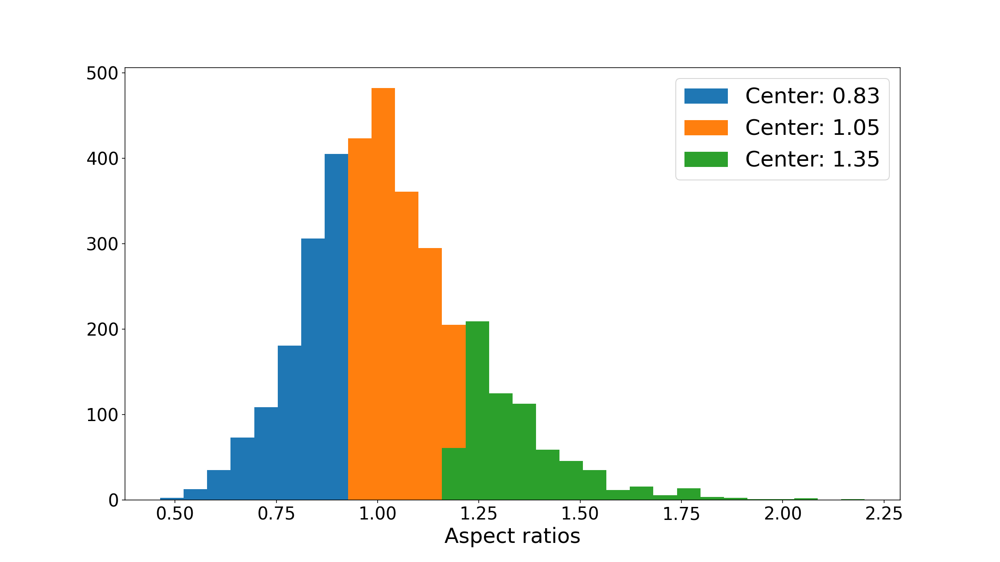

In [5]:
dash_generator = ObjectDetectionDatasetGeneratorRange(dash_ds, width=1000, height=700)
dash_generator.show()

## Taking a look at the new dataset
To use the new dataset we can just load it by providing the path to the json file as argument to the BboxRecordDataset class. This will automatically parse the json to a list of records.

In [6]:
# load the created dataset
new_dataset = BboxRecordDataset("datasets/test_ds.json")

0it [00:00, ?it/s]

INFO     - Autofixing records | icevision.parsers.parser:parse:136


  0%|          | 0/391 [00:00<?, ?it/s]

Before we train a model with the created dataset lets have a look at the dataset with the `ObjectDetectionDatasetOverview` dashboard.

Tabs
    [0] Column
        [0] Markdown(str)
        [1] DataFrame(formatters={'no_imgs': HTMLTemplateFo...}, height=100, selection=[0], sizing_mode='fixed', value=   no_imgs  no_classes    ..., width=1000)
        [2] Markdown(str)
        [3] DataFrame(formatters={'Num. imgs.': HTMLTemplat...}, height=100, selection=[0], sizing_mode='fixed', value=   Num. imgs.  ..., width=1000)
        [4] Markdown(str)
        [5] DataFrame(formatters={'Class': HTMLTemplateForm...}, height=175, selection=[0], sizing_mode='fixed', value=          Class  ..., width=1000)
        [6] Row(align='center')
            [0] Bokeh(Figure)
    [1] GridSpec(align='center', height=700, ncols=2, nrows=2, sizing_mode='fixed', width=1000)
        [0] Column(height=350, width=500)
            [0] Markdown(str)
            [1] Bokeh(Figure)
        [1] Column(height=350, width=500)
            [0] Markdown(str)
            [1] Bokeh(Figure)
        [2] Column(align='center', height=700, width=500)
            [0] Column
                [0] Column(align='center')
                    [0] Row(width=500)
                        [0] Select(name='X-Axis', options=['num_annotations', ...], value='num_annotations')
                        [1] Select(name='Y-Axis', options=['label', 'num_annotations...], value='label')
                    [1] Row(width=500)
                        [0] Checkbox(name='X is categorical')
                        [1] Checkbox(name='Normalize rows')
                        [2] IntInput(end=10, name='Precision', start=0, value=2)
                    [2] Row(width=500)
                        [0] RangeSlider(end=1.1, name='X-Axis Range', start=1, step=0.0020000000000000018, value=(1, 1.1))
                        [1] IntInput(end=500, name='Bins', start=1, value=10)
                [1] ParamFunction(function)
    [2] Column
        [0] IntInput(height=50, name='Number of aspect ratios', sizing_mode='fixed', value=3, width=1000)
        [1] IntInput(height=50, name='Bins', sizing_mode='fixed', value=30, width=1000)
        [2] ParamFunction(function)
    [3] Column(align='center', sizing_mode='stretch_both')
        [0] Column
            [0] Row(align='center', height=50)
                [0] Button(name='<', width=166)
                [1] TextInput(value='1', width=83)
                [2] Row(width=83)
                    [0] Markdown(str)
                [3] Button(name='>', width=166)
            [1] Row(align='center')
                [0] Bokeh(Figure)
    [4] DataFrame(formatters={'id': HTMLTemplateFormatt...}, height=700, selection=[0], sizing_mode='fixed', value=      id  width  height   ..., width=1000)
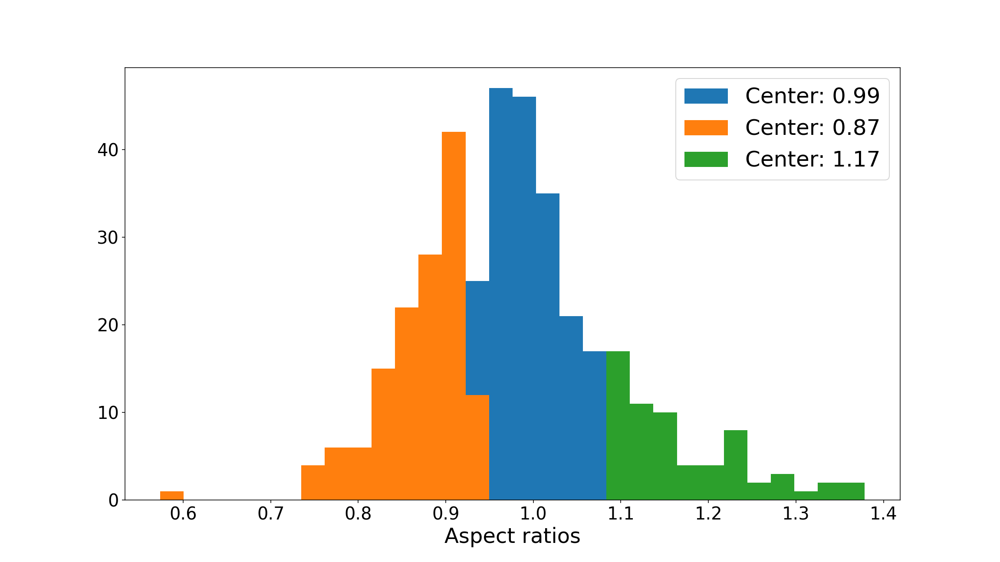

In [7]:
# quick overview of the dataset
ObjectDetectionDatasetOverview(new_dataset, height=700, width=1000).show()

## Prepare data for training
To create a training and validation set from the records we can use the build in `split_in_train_and_val` function which takes a float number for the fraction of training images and returns two list of records. Records for each list are choosen at random.

In [8]:
# split the records into a training and test dataset
train_records, valid_records = new_dataset.split_in_train_and_val(0.8)

In [9]:
ObjectDetectionDatasetComparison([BboxRecordDataset(train_records, class_map), BboxRecordDataset(valid_records, class_map)], height=700, width=1000).show()

Tabs
    [0] Column
        [0] Markdown(str)
        [1] Row
            [0] DataFrame(formatters={'Dataset_0': HTMLTemplate...}, height=50, selection=[0], sizing_mode='fixed', value=   Dataset_0  ..., width=500)
        [2] Markdown(str)
        [3] Row
            [0] DataFrame(formatters={'no_imgs': HTMLTemplateFo...}, height=100, selection=[0], sizing_mode='fixed', value=   no_imgs  no_classes    ..., width=500)
            [1] DataFrame(formatters={'no_imgs': HTMLTemplateFo...}, height=100, selection=[0], sizing_mode='fixed', value=   no_imgs  no_classes    ..., width=500)
        [4] Markdown(str)
        [5] Row
            [0] DataFrame(formatters={'Num. imgs.': HTMLTemplat...}, height=100, selection=[0], sizing_mode='fixed', value=   Num. imgs.  ..., width=500)
            [1] DataFrame(formatters={'Num. imgs.': HTMLTemplat...}, height=100, selection=[0], sizing_mode='fixed', value=   Num. imgs.  ..., width=500)
        [6] Markdown(str)
        [7] Row
            [0] DataFrame(formatters={'Class': HTMLTemplateForm...}, height=175, selection=[0], sizing_mode='fixed', value=          Class  ..., width=500)
            [1] DataFrame(formatters={'Class': HTMLTemplateForm...}, height=175, selection=[0], sizing_mode='fixed', value=          Class  ..., width=500)
        [8] Row(align='center')
            [0] Bokeh(Figure)
            [1] Bokeh(Figure)
    [1] Row(align='center')
        [0] ParamFunction(function)
        [1] Column
            [0] Column(align='center')
                [0] Row(width=525)
                    [0] Select(name='X-Axis', options=['num_annotations', ...], value='num_annotations')
                    [1] Select(name='Y-Axis', options=['label', 'num_annotations...], value='label')
                [1] Row(width=525)
                    [0] Checkbox(name='X is categorical')
                    [1] Checkbox(name='Normalize rows')
                    [2] IntInput(end=10, name='Precision', start=0, value=2)
                [2] Row(width=525)
                    [0] RangeSlider(end=1.1, name='X-Axis Range', start=1, step=0.0020000000000000018, value=(1, 1.1))
                    [1] IntInput(end=500, name='Bins', start=1, value=10)
            [1] ParamFunction(function)
    [2] Row(sizing_mode='stretch_both')
        [0] Column
            [0] Row(align='center', height=50)
                [0] Button(name='<', width=166)
                [1] TextInput(value='1', width=83)
                [2] Row(width=83)
                    [0] Markdown(str)
                [3] Button(name='>', width=166)
            [1] Row(align='center')
                [0] Bokeh(Figure)
        [1] Column
            [0] Row(align='center', height=50)
                [0] Button(name='<', width=166)
                [1] TextInput(value='1', width=83)
                [2] Row(width=83)
                    [0] Markdown(str)
                [3] Button(name='>', width=166)
            [1] Row(align='center')
                [0] Bokeh(Figure)
    [3] Row
        [0] DataFrame(formatters={'id': HTMLTemplateFormatt...}, height=700, selection=[0], sizing_mode='fixed', value=      id  width  height   ..., width=500)
        [1] DataFrame(formatters={'id': HTMLTemplateFormatt...}, height=700, selection=[0], sizing_mode='fixed', value=     id  width  height    ..., width=500)

## Train a model on the new Dataset
Now that we have the new dataset we can train a model on the data.

In [10]:
# define transforms
train_tfms = tfms.A.Adapter(
    [*tfms.A.aug_tfms(size=384, presize=512), tfms.A.Normalize()]
)
valid_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(384), tfms.A.Normalize()])

In [11]:
# create the datasets and dataloaders
train_ds = Dataset(train_records, train_tfms)
valid_ds = Dataset(valid_records, valid_tfms)

train_dl = faster_rcnn.train_dl(train_ds, batch_size=4, num_workers=4, shuffle=True)
valid_dl = faster_rcnn.valid_dl(valid_ds, batch_size=4, num_workers=4, shuffle=False)

In [12]:
metrics = [COCOMetric(metric_type=COCOMetricType.bbox)]

In [13]:
# create a model and train it for some epochs
model = faster_rcnn.model(num_classes=len(class_map))

learn = faster_rcnn.fastai.learner(dls=[train_dl, valid_dl], model=model, metrics=metrics)

learn.fine_tune(5, freeze_epochs=5, base_lr=1e-4)

epoch,train_loss,valid_loss,COCOMetric,time
0,1.086373,0.451013,0.000000,00:12
1,0.451115,0.292577,0.049473,00:11
2,0.280587,0.237932,0.160873,00:11
3,0.219498,0.209775,0.245180,00:11
4,0.198196,0.202331,0.266593,00:11


epoch,train_loss,valid_loss,COCOMetric,time
0,0.155469,0.173731,0.415271,00:20
1,0.150541,0.153666,0.456790,00:19
2,0.137497,0.129215,0.581079,00:18
3,0.117894,0.125337,0.619086,00:18
4,0.107378,0.119615,0.633993,00:18


In [14]:
samples_plus_losses, preds, losses_stats = faster_rcnn.interp.plot_top_losses(model=model, dataset=valid_ds, sort_by="loss_total", n_samples=1, batch_size=2)

INFO     - Losses returned by model: ['loss_classifier', 'loss_box_reg', 'loss_objectness', 'loss_rpn_box_reg'] | icevision.models.interpretation:plot_top_losses:218


  0%|          | 0/79 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

In [15]:
# create a dataset that can be consumed by the analysis dashboard
valid_result_ds = ObjectDetectionResultsDataset.init_from_preds_and_samples(preds, samples_plus_losses, class_map=class_map)

In [16]:
# create the dashboard
result_overview_dash = ObjectDetectionResultOverview(valid_result_ds, width=1200)

Tabs
    [0] Column
        [0] Matplotlib(Figure, width=1200)
        [1] Tabs
            [0] Row(align='center')
                [0] Spacer(sizing_mode='stretch_width')
                [1] Column
                    [0] Row
                        [0] Select(height=50, name='X-Axis', options=['area_normalized', ...], sizing_mode='fixed', value='area_normalized', width=166)
                        [1] Select(height=50, name='Y-Axis', options=['score', 'area_normalized...], sizing_mode='fixed', value='score', width=166)
                        [2] Select(height=50, name='Color', options=['label', 'num_annotations...], sizing_mode='fixed', value='label', width=166)
                    [1] Bokeh(Column)
                [2] Spacer(sizing_mode='stretch_width')
                [3] Column
                    [0] Column(align='center')
                        [0] Row(width=500)
                            [0] Select(name='X-Axis', options=['loss_classifier', ...], value='loss_classifier')
                            [1] Select(name='Y-Axis', options=['label', 'num_annotations...], value='label')
                        [1] Row(width=500)
                            [0] Checkbox(name='X is categorical')
                            [1] Checkbox(name='Normalize rows')
                            [2] IntInput(end=10, name='Precision', start=0, value=2)
                        [2] Row(width=500)
                            [0] RangeSlider(end=0.24841631948947906, name='X-Axis Range', start=0.012625860050320625, step=0.004715809188783168, value=(0.012625860050320625, ...)
                            [1] IntInput(end=500, name='Bins', start=1, value=10)
                    [1] ParamFunction(function)
                [4] Spacer(sizing_mode='stretch_width')
            [1] Column
                [0] Row(align='center', height=50)
                    [0] Button(name='<', width=166)
                    [1] TextInput(value='1', width=83)
                    [2] Row(width=83)
                        [0] Markdown(str)
                    [3] Button(name='>', width=166)
                [1] Row(align='center')
                    [0] Row
                        [0] Column
                            [0] Row(align='center')
                                [0] Markdown(str)
                            [1] Bokeh(Figure)
                        [1] Column
                            [0] Row(align='center')
                                [0] Markdown(str)
                            [1] Bokeh(Figure)
    [1] Tabs
        [0] Column
            [0] Row(align='center')
                [0] DataFrame(formatters={'AP': HTMLTemplateFormatt...}, height=75, selection=[0], sizing_mode='fixed', value=             A..., width=500)
            [1] Row(align='center')
                [0] Column
                    [0] Markdown(str)
                    [1] Bokeh(Figure)
                [1] Column
                    [0] Markdown(str)
                    [1] Bokeh(Figure)
                [2] Column
                    [0] Markdown(str)
                    [1] Bokeh(Figure)
        [1] Column(width=1200)
            [0] ParamFunction(function)
        [2] Column
            [0] Markdown(str)
        [3] Column(width=1200)
            [0] ParamFunction(function)
        [4] Column(width=1200)
            [0] ParamFunction(function)
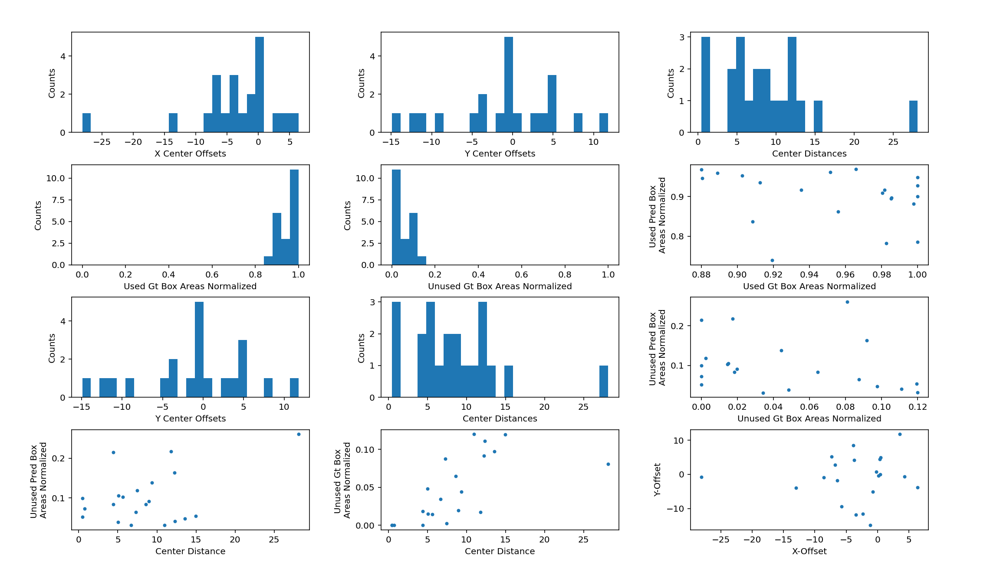
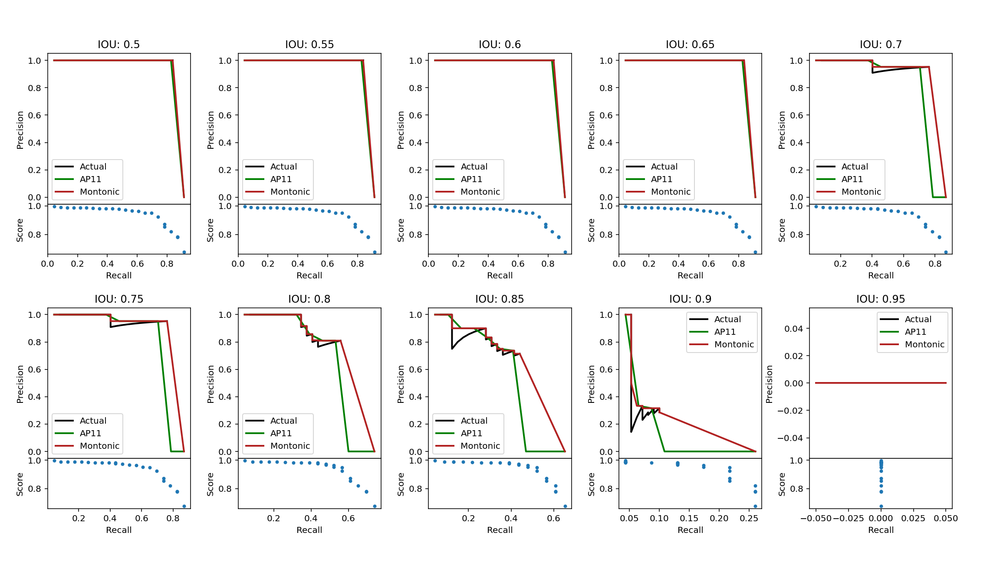
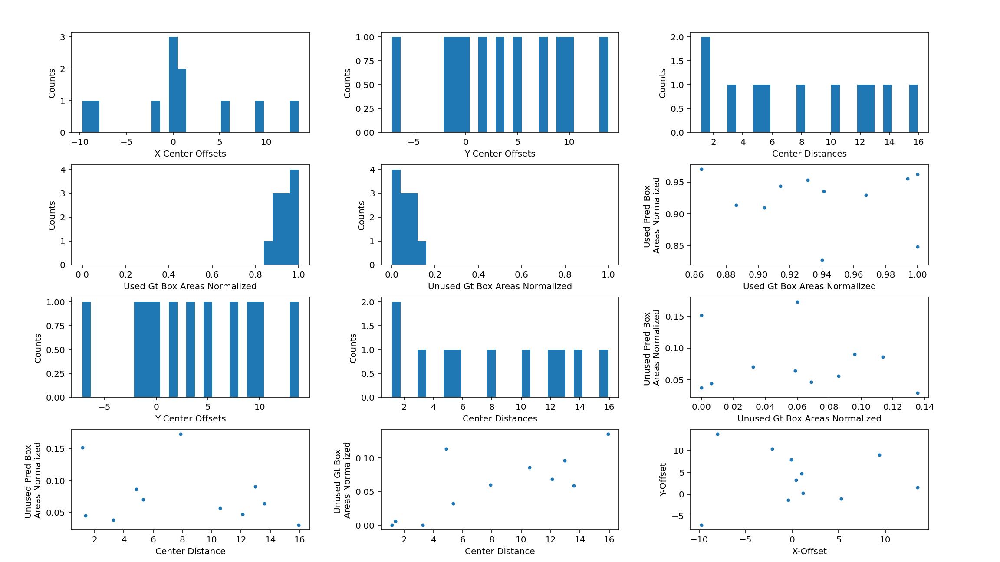
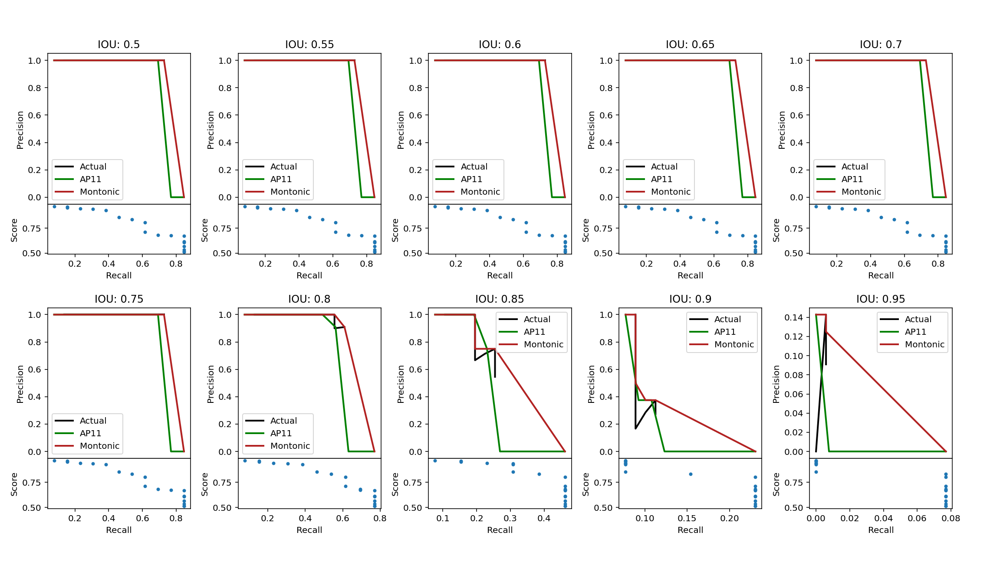
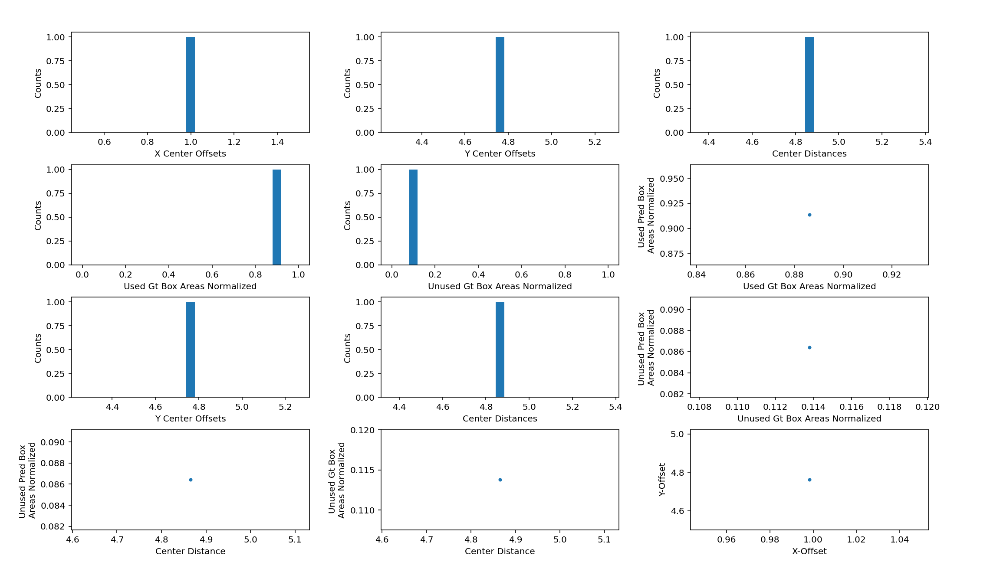
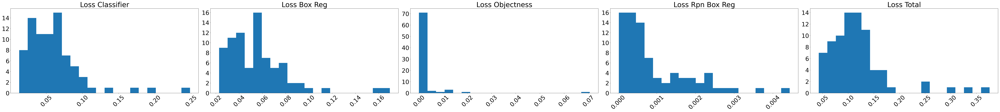
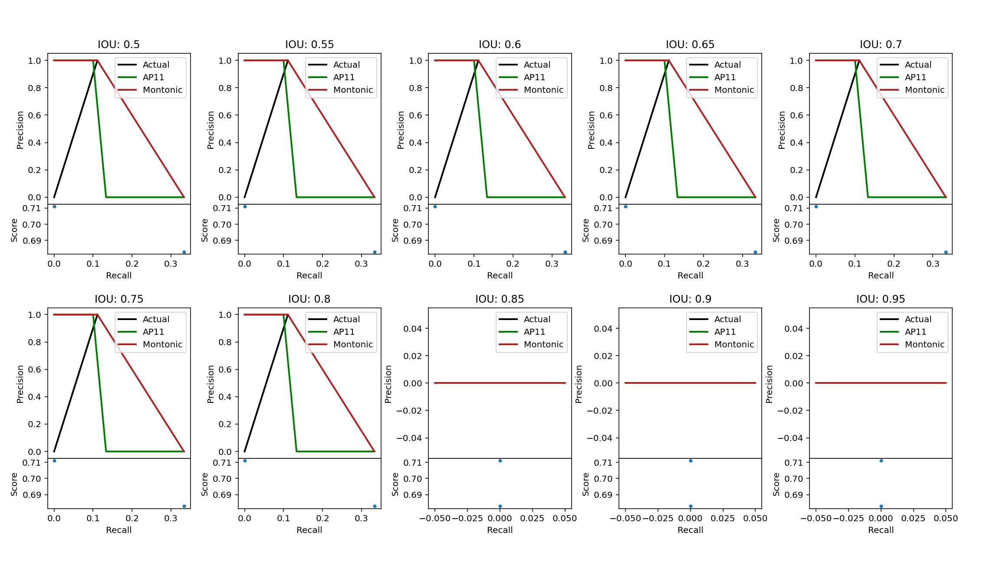

In [17]:
# show results overview dashboard
result_overview_dash.show()